In [160]:
import pickle
import matplotlib.pyplot as plt
from pylab import rcParams
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from collections import Counter
import umap
import networkx as nx
from itertools import permutations 
import hdbscan
import numpy as np
import copy
from approval_profile import *

In [606]:
# profile = Profile_Synthetic(list(range(50000, 10000, -2000)), list(range(10000, 1, -500)), budget_distribution=uniform, low=500, high=10000, spread_of_approvals=2., sdcavpd=0.1, noise=0.02)
# profile = Profile_Synthetic(list(range(4000, 1, -200)), list(range(1000, 1, -50)), budget_distribution=uniform, low=500, high=10000, spread_of_approvals=2.5, sdcavpd=0.3, noise=0.02)
# profile = Profile_Synthetic(list(range(800, 1, -40)), list(range(200, 1, -10)), budget_distribution=uniform, low=500, high=10000, spread_of_approvals=2., sdcavpd=0.3, noise=0.02)
profile = Profile_Synthetic(list(range(500000, 100000, -20000)), list(range(100000, 1, -5000)), budget_distribution=uniform, low=500, high=100000, spread_of_approvals=3., sdcavpd=0.3, noise=0.02)


In [608]:
# profile.save("gen_data//100000_20_liniear.pb")

In [ ]:
# profile = Profile_Synthetic.load('gen_data//55000_20_liniear.pb')

In [607]:
np.set_printoptions(threshold=10000)
x,y = np.unique(profile.ballots, return_counts=True, axis=0)
print(len(y), len(profile.ballots))
print(profile.approvals)
z,w = np.unique(np.sum(profile.ballots, 1), return_counts=True)
list(zip(z,w))
# sorted(y, reverse=True)


99673 1050000
[470547. 425443. 438019. 391471. 420651. 401207. 332473. 367816. 307143.
 325887. 276721. 270471. 216036. 266339. 225537. 189489. 207621. 159050.
 130285. 196620.]


[(1.0, 60577),
 (2.0, 122363),
 (3.0, 108409),
 (4.0, 93198),
 (5.0, 117177),
 (6.0, 121275),
 (7.0, 117078),
 (8.0, 123363),
 (9.0, 77648),
 (10.0, 51395),
 (11.0, 28375),
 (12.0, 15701),
 (13.0, 8334),
 (14.0, 3318),
 (15.0, 1357),
 (16.0, 329),
 (17.0, 72),
 (18.0, 27),
 (19.0, 3),
 (20.0, 1)]

In [609]:
data = profile.ballots
subdata = copy.deepcopy(data)
np.random.shuffle(subdata)
old_clusters = profile.clusters
old_labels = [j for i,cluster in enumerate(old_clusters) for j in len(cluster)*[i]]

In [610]:
reducer = umap.UMAP(n_components=2, n_neighbors=100, metric='manhattan')
reducer.fit(subdata[:5000])
print("fit done")
embedding = reducer.transform(data)

fit done


/home/jonne/anaconda3/lib/python3.7/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


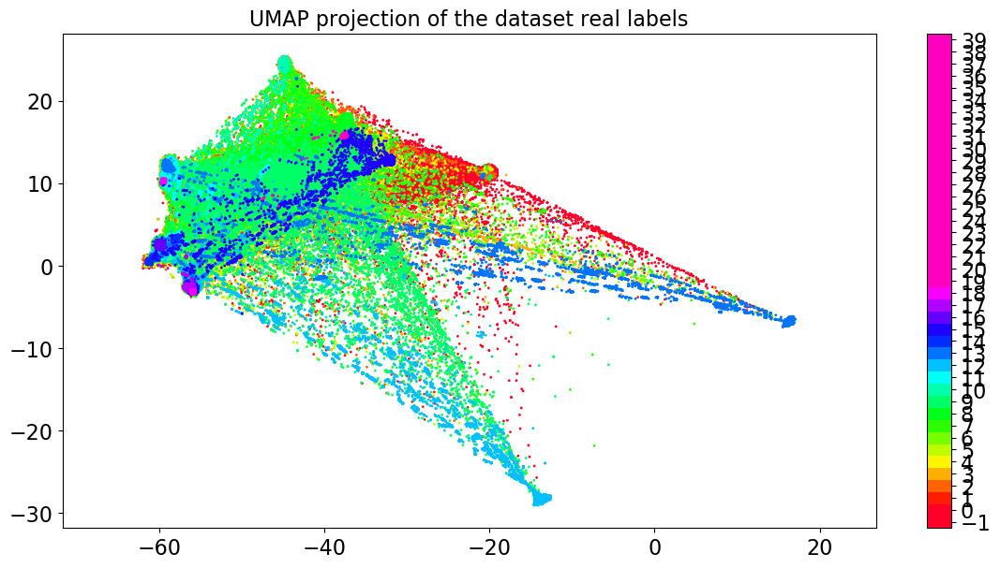

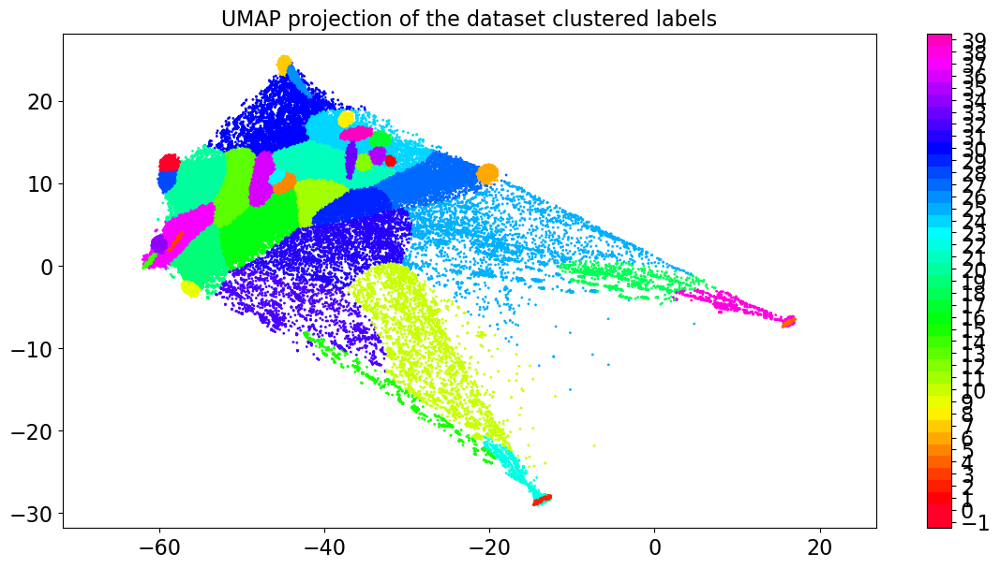

In [619]:
# n_clusters = len(old_clusters)
# k = KMeans(n_clusters).fit(embedding)

n_clusters = len(old_clusters)*2
k = GaussianMixture(n_clusters).fit(embedding)
k.labels_ = k.predict(embedding)

# k = DBSCAN(0.9).fit(embedding)
# n_clusters = max(k.labels_) + 1

# k = hdbscan.HDBSCAN(min_cluster_size=len(data)//100, gen_min_span_tree=False).fit(embedding)
# n_clusters = max(k.labels_) + 1

# # Visualization of HDBSCAN
# import seaborn as sns
# k.minimum_spanning_tree_.plot(edge_cmap='viridis',
#                                       edge_alpha=0.6,
#                                       node_size=10,
#                                       edge_linewidth=1)
# plt.show()

# k.condensed_tree_.plot()
# plt.show()

# k.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())
# plt.show()

rcParams['figure.figsize'] = 14, 7
rcParams['figure.dpi'] = 100
rcParams.update({'font.size': 16})

plt.scatter(embedding[:, 0], embedding[:, 1], c=old_labels, s=1, cmap='gist_rainbow')
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(-1, n_clusters+1)-0.5).set_ticks(np.arange(-1, n_clusters))
plt.title('UMAP projection of the dataset real labels', fontsize=16)
plt.show()

if embedding.shape[1] >= 4:
    plt.scatter(embedding[:, 2], embedding[:, 3], c=old_labels, s=1, cmap='gist_rainbow')
    plt.gca().set_aspect('equal', 'datalim')
    plt.colorbar(boundaries=np.arange(-1, n_clusters+1)-0.5).set_ticks(np.arange(-1, n_clusters))
    plt.title('UMAP projection of the dataset real labels', fontsize=16)
    plt.show()

plt.scatter(embedding[:, 0], embedding[:, 1], c=k.labels_, s=1, cmap='gist_rainbow')
# plt.scatter(embedding[:, 0], embedding[:, 1], c=old_labels, s=1, cmap='gist_rainbow')
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(-1, n_clusters+1)-0.5).set_ticks(np.arange(-1, n_clusters))
plt.title('UMAP projection of the dataset clustered labels', fontsize=16)
plt.show()

if embedding.shape[1] >= 4:
    plt.scatter(embedding[:, 2], embedding[:, 3], c=k.labels_, s=1, cmap='gist_rainbow')
    plt.gca().set_aspect('equal', 'datalim')
    plt.colorbar(boundaries=np.arange(-1, n_clusters+1)-0.5).set_ticks(np.arange(-1, n_clusters))
    plt.title('UMAP projection of the dataset clustered labels', fontsize=16)
    plt.show()

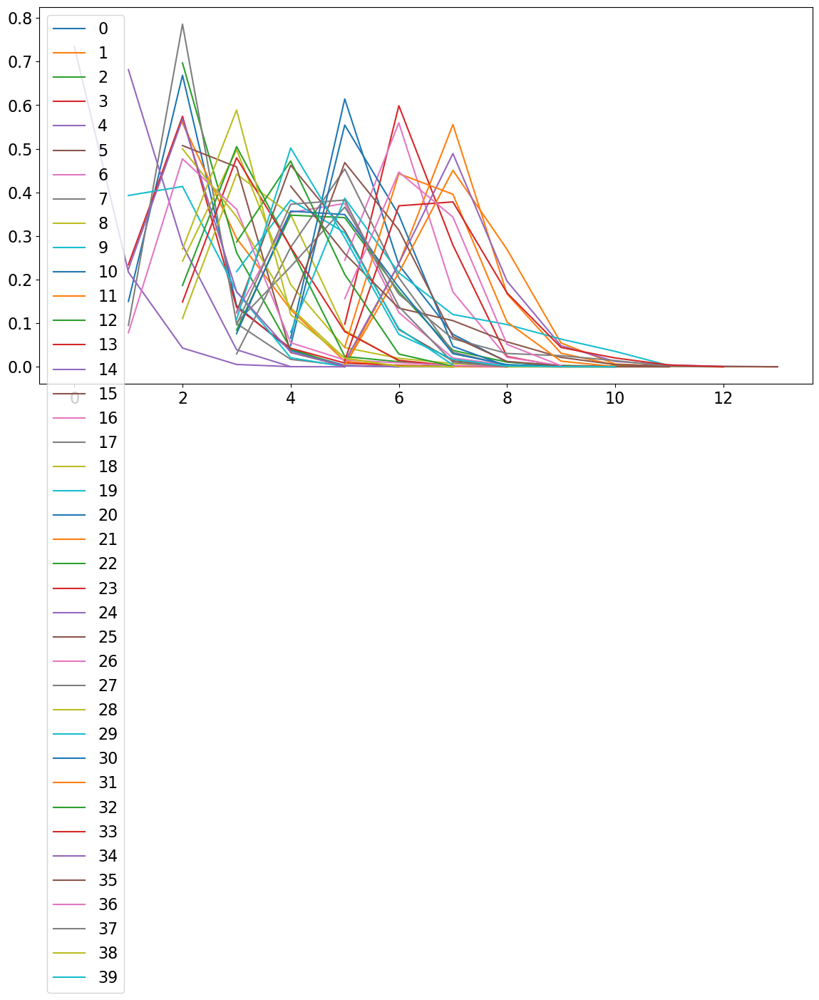

In [620]:
# print(f"number of approvals per cluster: {np.sum(cluster_mean, 1)}")
cluster_size = Counter(k.labels_) 

distance = {i:{} for i in range(-1,n_clusters)}
cluster_centers_ = [np.mean(data[k.labels_ == i],0) for i in range(n_clusters)]
for c, ballot in zip(k.labels_, data):
    dis = int(np.abs(ballot - cluster_centers_[c]).sum())
    try:
        distance[c][dis] += 1/cluster_size[c]
    except KeyError:
        distance[c][dis] = 1/cluster_size[c]
k = GaussianMixture(n_clusters).fit(embedding)
k.labels_ = k.predict(embedding)
        
for c, dist in distance.items():
    plt.plot(*zip(*sorted(dist.items())), label=c)
plt.legend()
plt.show()

0
{0: 0.9314166955316938, 1: 0.927086941461725, 2: 0.7031520609629373, 3: 0.15240734326290267, 4: 0.012469691721510218, 5: 0.040872878420505715, 6: 0.1387253204018012, 7: 0.8630065812261863, 8: 0.7975406996882577, 9: 0.10512642881884308, 10: 0.09023207481815033, 11: 0.945964669206789, 12: 0.11240041565639072, 13: 0.08642189123657776, 14: 0.009525458953931417, 15: 0.0025978524419812956, 16: 0.004502944232767579, 17: 0.0999307239348805, 18: 0.09785244198129546, 19: 0.005368895046761344}
5774


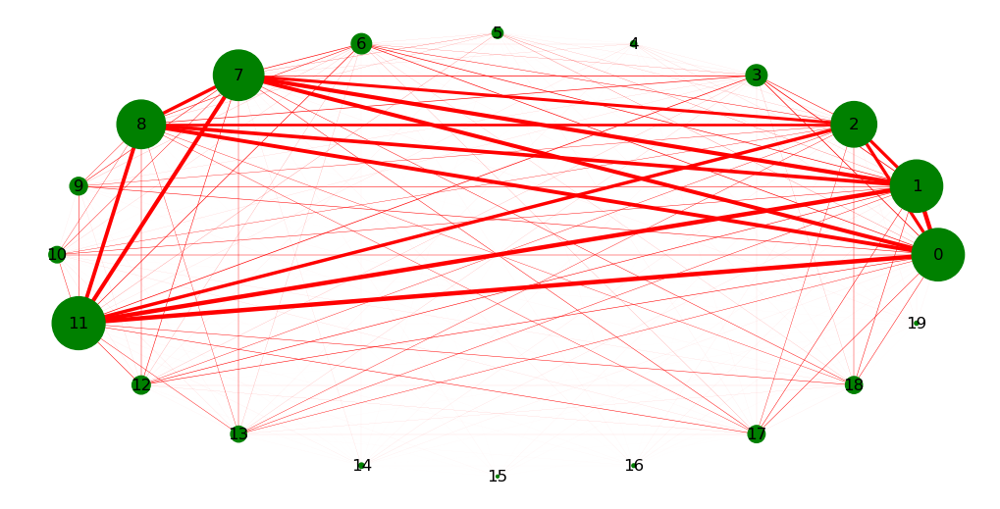

1
{0: 0.9432375012849947, 1: 0.11768838022136176, 2: 0.11391906246787513, 3: 0.12478155090292294, 4: 0.23102491176369805, 5: 0.11998423739848542, 6: 0.9735976424630778, 7: 0.11868210944728096, 8: 0.12479868416543878, 9: 0.9921529657677415, 10: 0.817753486618922, 11: 0.12090943357434122, 12: 0.12627214474180173, 13: 0.5731076311551245, 14: 0.44486516122400027, 15: 0.1227769591885687, 16: 0.9346537367645547, 17: 0.48475139636089504, 18: 0.13014426207038343, 19: 0.4601480313881369}
58366


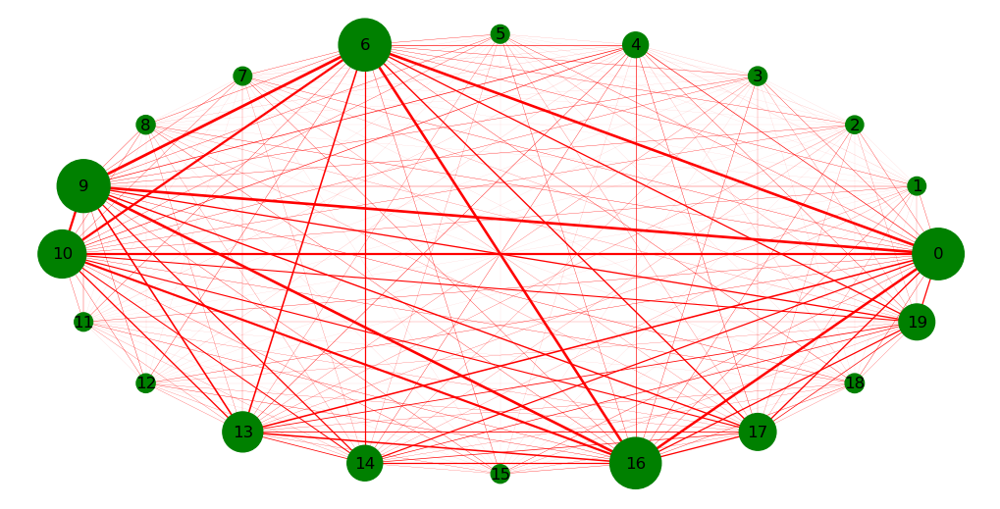

2
{0: 0.5699649637621583, 1: 0.014482488205309825, 2: 0.006172449121564362, 3: 0.009144837530514413, 4: 0.021009094243685255, 5: 0.1926107688999633, 6: 0.018492050442063722, 7: 0.3650092966190663, 8: 0.014760754354232807, 9: 0.01691099277772859, 10: 0.019807490418790555, 11: 0.025170438016215328, 12: 0.026688253373977056, 13: 0.1928763865875716, 14: 0.0170374773908754, 15: 0.010725895194849547, 16: 0.3891805061914218, 17: 0.011143294418234022, 18: 0.012711703621254474, 19: 0.022881066518258053}
79061


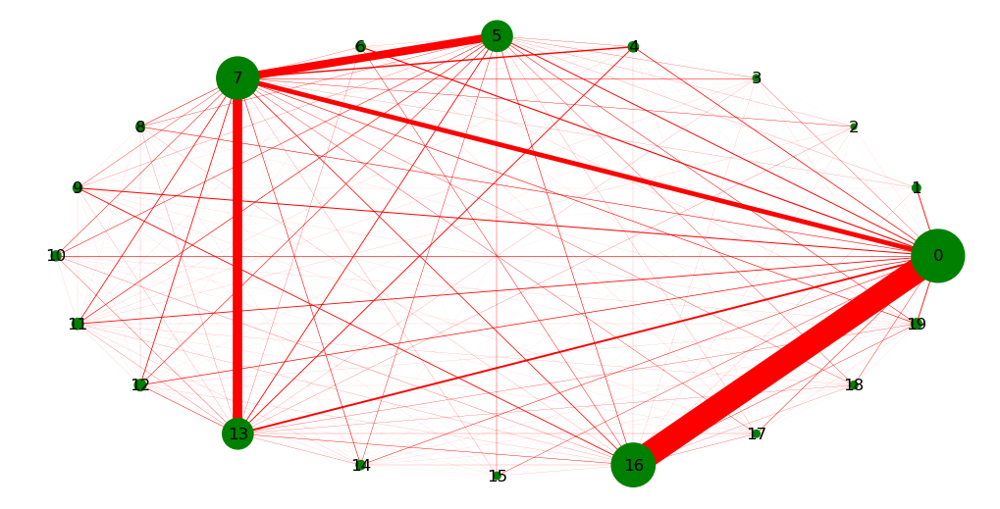

3
{0: 0.4426720534967958, 1: 0.86862635831708, 2: 0.4447966007244358, 3: 0.00013931457230426304, 4: 0.00045277235998885485, 5: 0.44552800222903316, 6: 0.7613541376427975, 7: 0.0004876010030649206, 8: 0.975097520200613, 9: 0.7505920869322931, 10: 0.00027862914460852607, 11: 0.00010448592922819726, 12: 0.00013931457230426304, 13: 6.965728615213152e-05, 14: 0.0, 15: 0.7824254667038172, 16: 6.965728615213152e-05, 17: 0.9995123989969351, 18: 0.9915714683755921, 19: 0.00020897185845639453}
28712


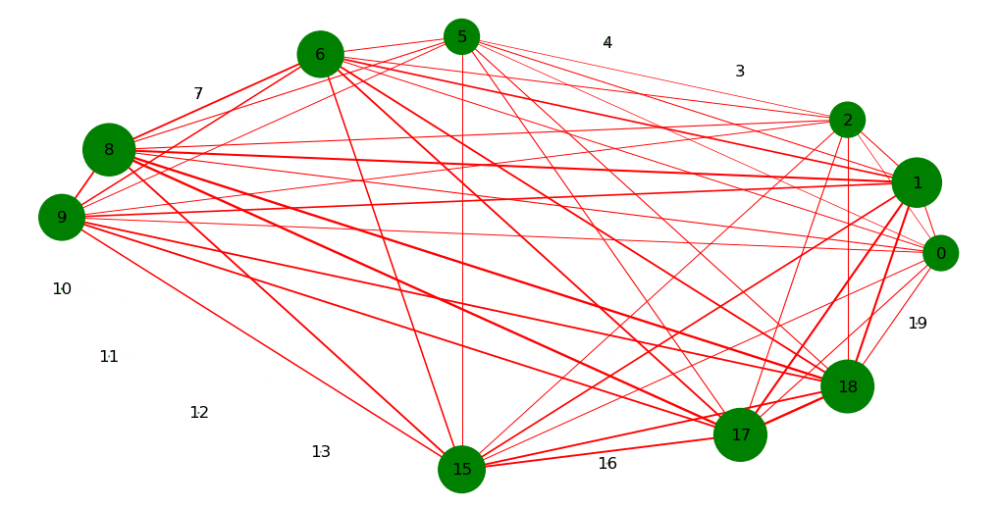

4
{0: 0.14029006146005096, 1: 0.838405036726128, 2: 0.7296132513865987, 3: 0.9335556888022786, 4: 0.9563408784290212, 5: 0.9268288112726728, 6: 0.1519449857592565, 7: 0.35688052765702294, 8: 0.9015140158896717, 9: 0.1343314345675311, 10: 0.19729051116774096, 11: 0.18481112277019937, 12: 0.6887085894168791, 13: 0.18464248238644881, 14: 0.1915754759406386, 15: 0.14383150951881277, 16: 0.193898965672313, 17: 0.16710388247639035, 18: 0.18005171638435016, 19: 0.1985272073152451}
53368


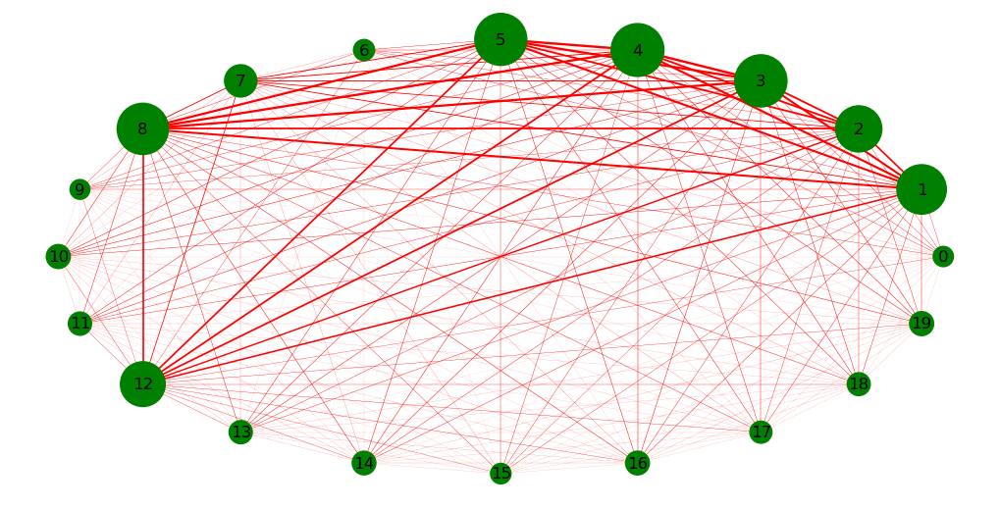

5
{0: 0.5608658582796514, 1: 0.00042629784009094355, 2: 0.9424497915877226, 3: 0.0005210306934444865, 4: 9.473285335354301e-05, 5: 0.9539124668435013, 6: 0.9892478211443728, 7: 4.7366426676771504e-05, 8: 0.9955475558923835, 9: 0.9196191739295188, 10: 0.7544050776809398, 11: 0.973664266767715, 12: 9.473285335354301e-05, 13: 0.0003315649867374005, 14: 0.586633194391815, 15: 4.7366426676771504e-05, 16: 0.00037893141341417203, 17: 0.0003315649867374005, 18: 9.473285335354301e-05, 19: 0.00028419856006062905}
21112


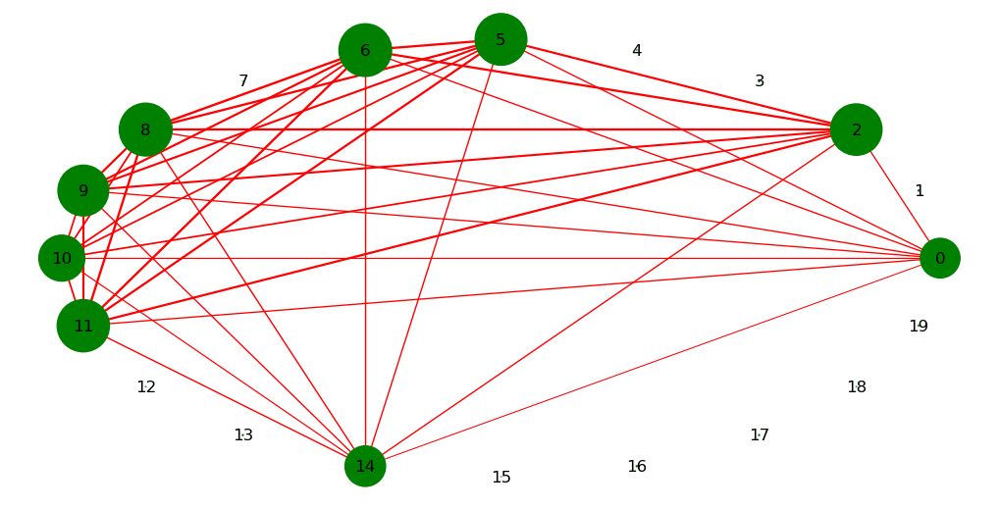

6
{0: 0.16615384615384615, 1: 0.4076043956043956, 2: 0.06536263736263737, 3: 0.5256703296703297, 4: 0.20685714285714285, 5: 0.29643956043956043, 6: 0.1876043956043956, 7: 0.1396043956043956, 8: 0.37648351648351647, 9: 0.1782857142857143, 10: 0.2837802197802198, 11: 0.17274725274725275, 12: 0.13476923076923078, 13: 0.26074725274725274, 14: 0.25947252747252747, 15: 0.0625054945054945, 16: 0.3021098901098901, 17: 0.11024175824175825, 18: 0.12004395604395604, 19: 0.20672527472527472}
22750


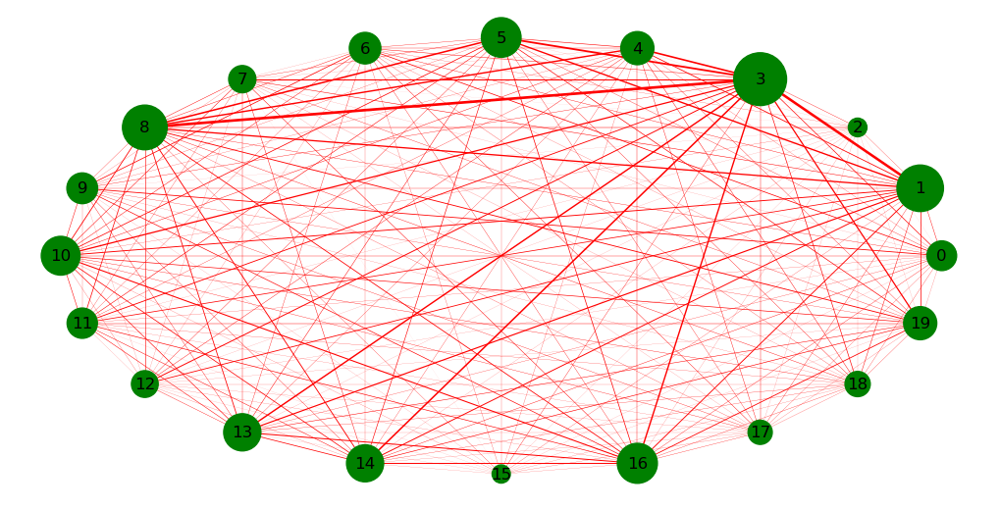

7
{0: 0.28389351081530784, 1: 0.022678868552412645, 2: 0.9959567387687188, 3: 0.42858569051580697, 4: 0.03454242928452579, 5: 0.46577371048252914, 6: 0.0397504159733777, 7: 0.04599001663893511, 8: 0.029434276206322794, 9: 0.2797171381031614, 10: 0.01735440931780366, 11: 0.0348585690515807, 12: 0.025058236272878537, 13: 0.013111480865224626, 14: 0.013793677204658902, 15: 0.050715474209650585, 16: 0.008136439267886856, 17: 0.015324459234608985, 18: 0.01156405990016639, 19: 0.012529118136439268}
60100


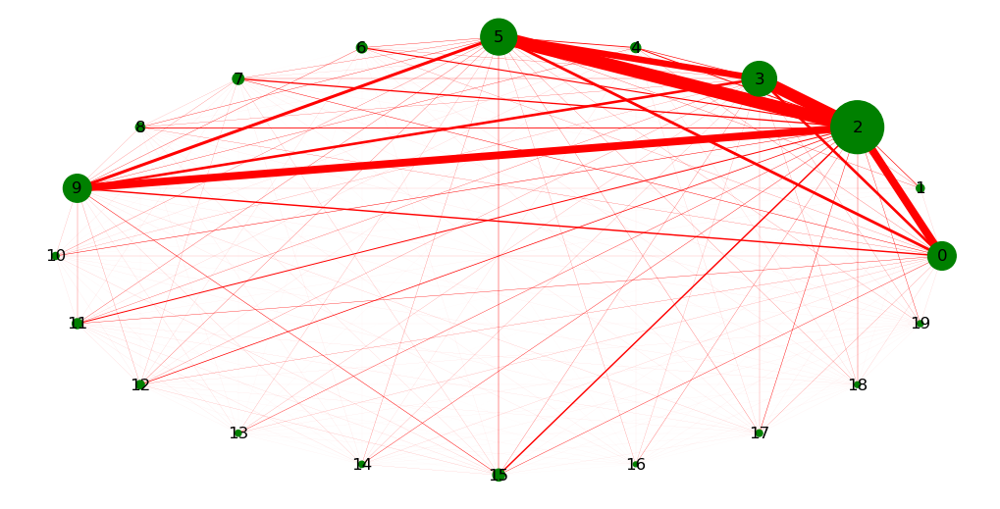

8
{0: 0.18405863490609253, 1: 0.22031607879065507, 2: 0.9305771873568484, 3: 0.19853412734768666, 4: 0.9799129638112689, 5: 0.6408153916628493, 6: 0.8397388914338066, 7: 0.19867155290884103, 8: 0.17045350435180945, 9: 0.8829821346770499, 10: 0.1788135593220339, 11: 0.20494732020155748, 12: 0.18284470911589557, 13: 0.0037562986715529087, 14: 0.022743930371049013, 15: 0.8997938616582685, 16: 0.002656894182317911, 17: 0.028721942281264314, 18: 0.013513513513513514, 19: 0.005794777828676134}
43660


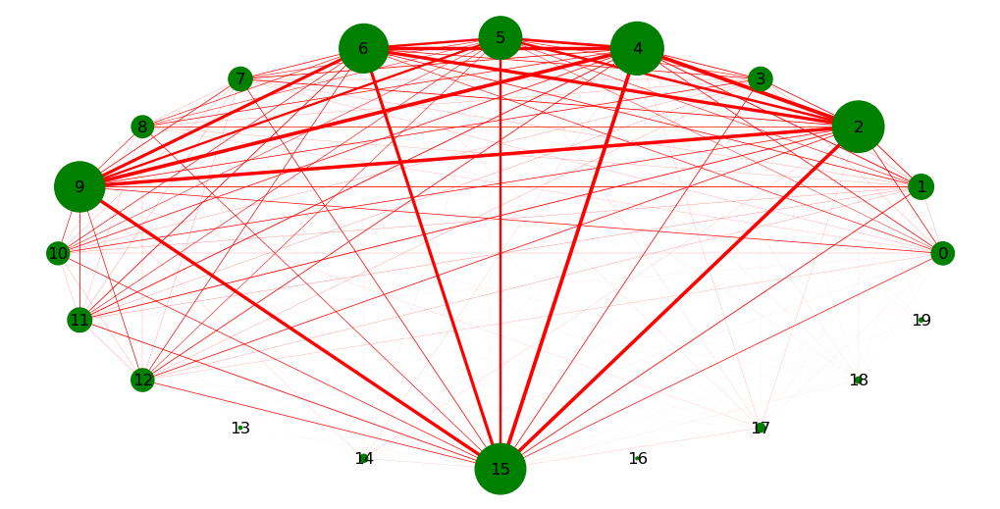

9
{0: 0.40328394072887463, 1: 0.6768121746095315, 2: 0.4557468962755306, 3: 0.14016820184221065, 4: 0.39247096515818986, 5: 0.44533440128153784, 6: 0.6924309171005206, 7: 0.04445334401281538, 8: 0.6543852623147778, 9: 0.38526231477773326, 10: 0.17020424509411294, 11: 0.06047256708049659, 12: 0.05486583900680817, 13: 0.02042450941129355, 14: 0.01882258710452543, 15: 0.5430516619943933, 16: 0.021625951141369643, 17: 0.9331197436924309, 18: 0.7877452943532238, 19: 0.05887064477372848}
2497


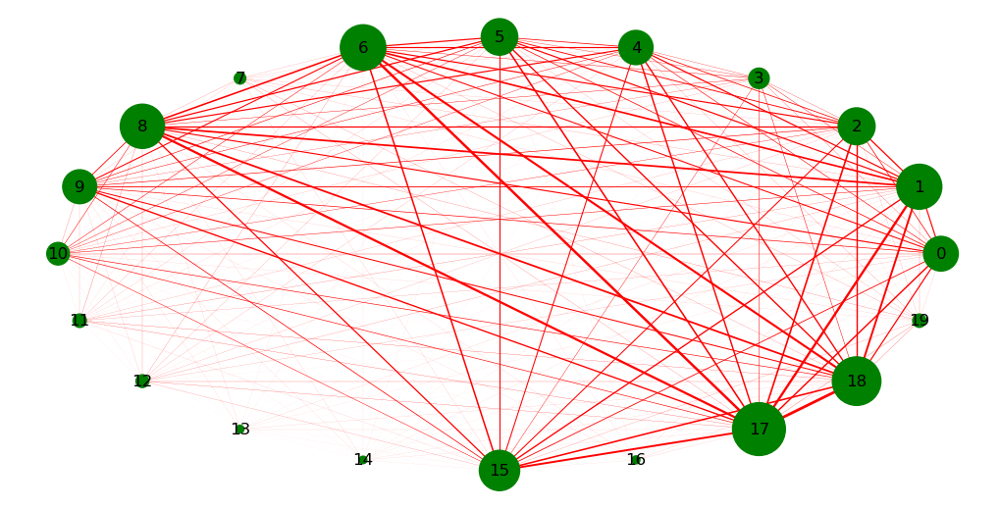

10
{0: 0.015431133354186216, 1: 0.4130608556632954, 2: 0.008845097834775658, 3: 0.690265179161019, 4: 0.01887185903451152, 5: 0.03941194870190804, 6: 0.017916101901087826, 7: 0.02884648802696973, 8: 0.32949292739721264, 9: 0.007576547457686025, 10: 0.11244917109790428, 11: 0.028412052966322595, 12: 0.06017794460084107, 13: 0.03663156431376638, 14: 0.05366141869113405, 15: 0.012702881173322212, 16: 0.07215097487227609, 17: 0.016126229451221632, 18: 0.02549264935877385, 19: 0.026326764675216347}
57546


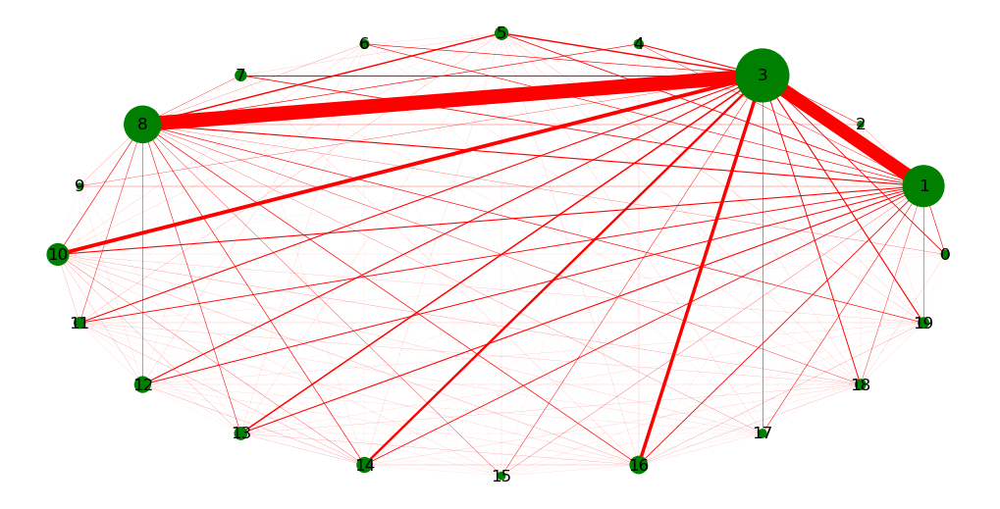

11
{0: 0.27946262303804204, 1: 0.2683559457302474, 2: 0.09244479914870976, 3: 0.262170790103751, 4: 0.2832535248736366, 5: 0.30207501995211494, 6: 0.12616387337057727, 7: 0.33532854482575153, 8: 0.14066241021548284, 9: 0.18262835860601223, 10: 0.21348762968874702, 11: 0.2612396914072892, 12: 0.14977387603085926, 13: 0.25771481777068367, 14: 0.17684224527799947, 15: 0.08206969938813514, 16: 0.18136472466081405, 17: 0.12243947858472998, 18: 0.1062782654961426, 19: 0.164072891726523}
15036


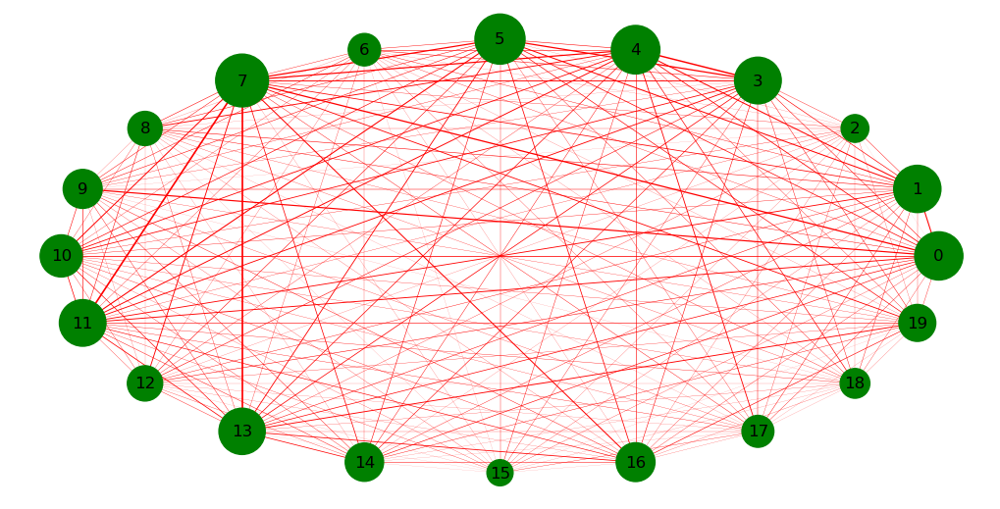

12
{0: 0.07684630738522955, 1: 0.3712574850299401, 2: 0.14271457085828343, 3: 0.09580838323353294, 4: 0.06087824351297405, 5: 0.15269461077844312, 6: 0.5299401197604791, 7: 0.018962075848303395, 8: 0.3522954091816367, 9: 0.2465069860279441, 10: 0.06187624750499002, 11: 0.01996007984031936, 12: 0.04890219560878244, 13: 0.014970059880239521, 14: 0.013972055888223553, 15: 0.28542914171656686, 16: 0.016966067864271458, 17: 0.8892215568862275, 18: 0.6846307385229541, 19: 0.03093812375249501}
1002


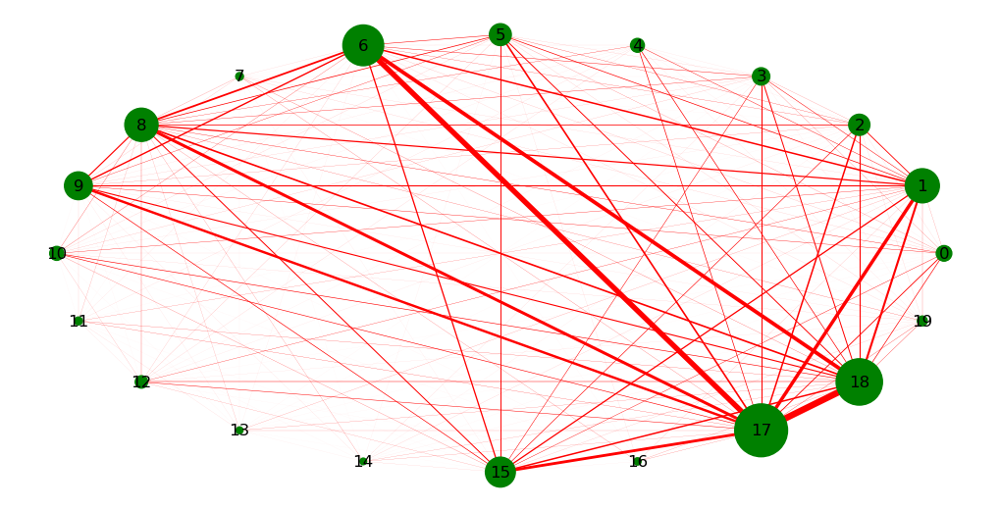

13
{0: 0.880084426353083, 1: 0.20072365445499774, 2: 0.7601990049751244, 3: 0.20690486959143675, 4: 0.948680838233077, 5: 0.003015226895823911, 6: 0.21206090758329565, 7: 0.9592944369063772, 8: 0.00370872908186341, 9: 0.20702547866726972, 10: 0.20796019900497512, 11: 0.21598070254786672, 12: 0.9513945424393185, 13: 0.9800391979496457, 14: 0.2116387758178803, 15: 0.00018091361374943465, 16: 0.0023518769787426504, 17: 0.2094678124528871, 18: 0.0020805065581184982, 19: 0.729383386099804}
33165


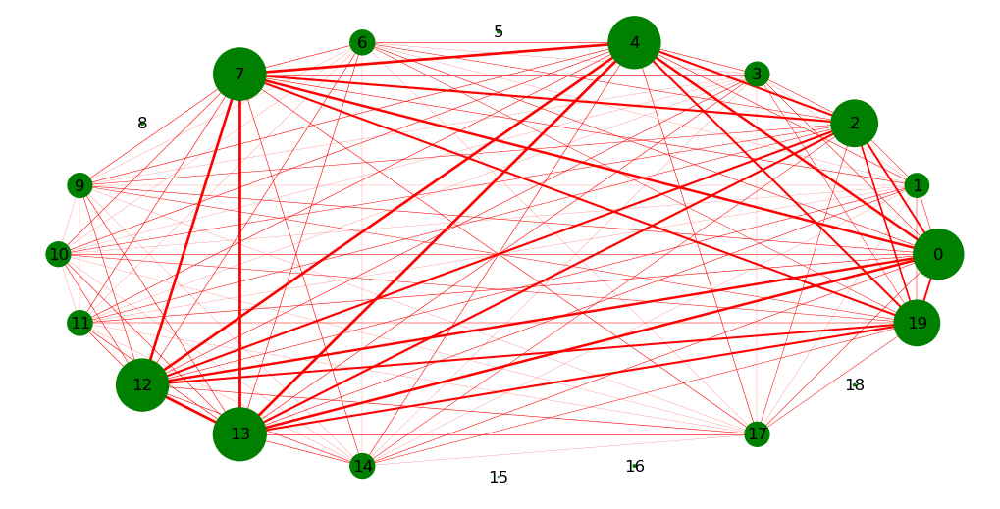

14
{0: 0.17125, 1: 0.010416666666666666, 2: 0.8004166666666667, 3: 0.013333333333333334, 4: 0.052083333333333336, 5: 0.69875, 6: 0.7475, 7: 0.009166666666666667, 8: 0.8783333333333333, 9: 0.7054166666666667, 10: 0.3825, 11: 0.63, 12: 0.010416666666666666, 13: 0.004166666666666667, 14: 0.12291666666666666, 15: 0.022083333333333333, 16: 0.008333333333333333, 17: 0.00875, 18: 0.006666666666666667, 19: 0.007916666666666667}
2400


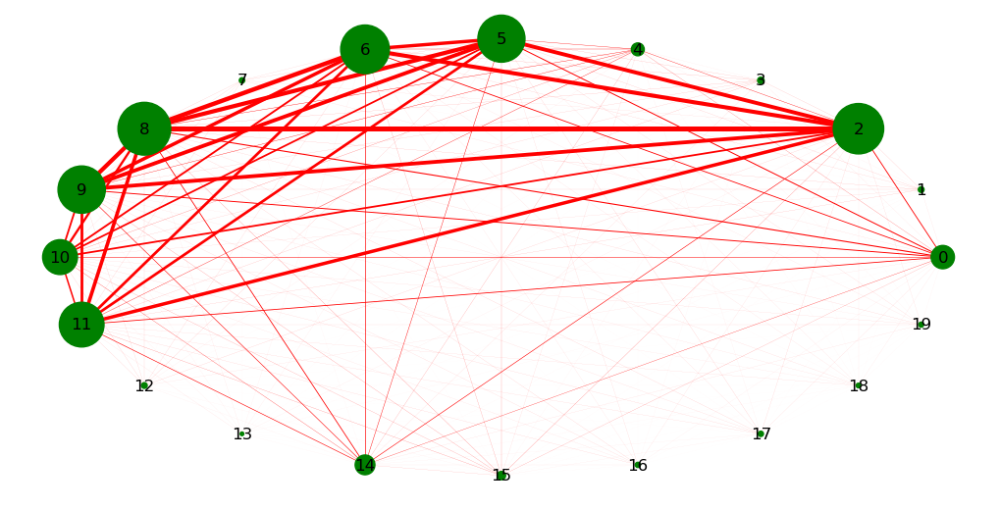

15
{0: 0.9603801567844064, 1: 0.9609552347226006, 2: 0.01622325130905899, 3: 0.8012349042041224, 4: 0.1993855746239293, 5: 0.4870002118708193, 6: 0.17785041920154968, 7: 0.6557704531008808, 8: 0.18488755712945307, 9: 0.18369200036320713, 10: 0.29531765489270256, 11: 0.029101970398619812, 12: 0.7553194709282969, 13: 0.8029601380187051, 14: 0.45400889857441207, 15: 0.001694966554677805, 16: 0.015920578710009382, 17: 0.008202427434244378, 18: 0.176821332364781, 19: 0.18900390447652773}
66078


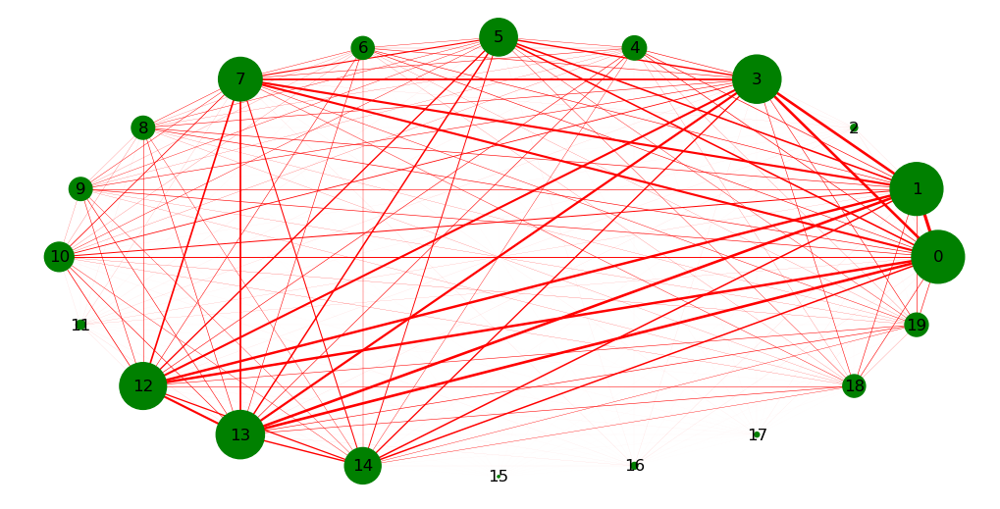

16
{0: 0.2766240912908738, 1: 0.5310336837837055, 2: 0.3216613085411417, 3: 0.5385350595186376, 4: 0.6105946071190662, 5: 0.5637037680655719, 6: 0.21012540910012453, 7: 0.3267587685000145, 8: 0.37081124916731834, 9: 0.15243143047470095, 10: 0.3070350740000579, 11: 0.27998378080922176, 12: 0.2218843224143424, 13: 0.3114084629420454, 14: 0.23008080632548442, 15: 0.13850030410982708, 16: 0.25901468416022244, 17: 0.16242361050771859, 18: 0.167144553537811, 19: 0.21061777739160656}
34527


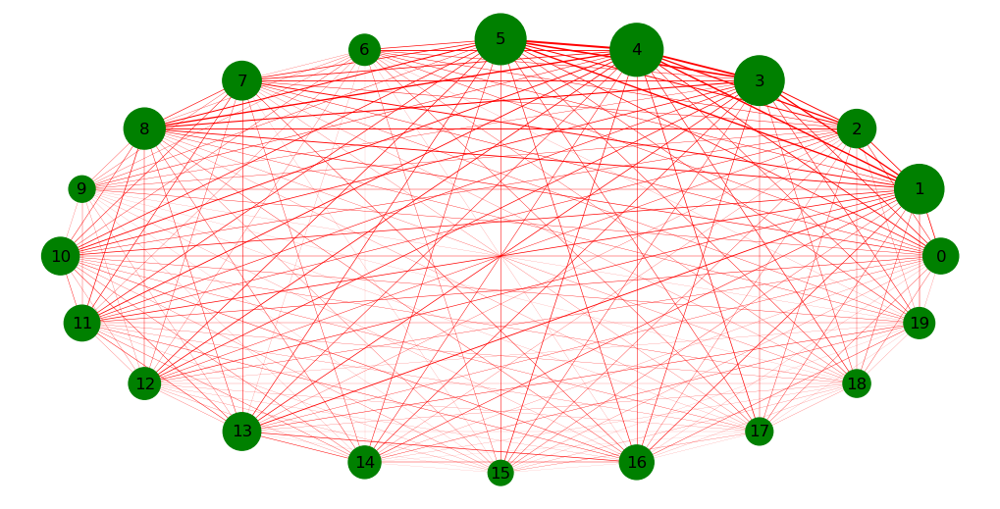

17
{0: 0.913042442151419, 1: 0.9773610085074947, 2: 0.9491218454352643, 3: 0.44620260705859927, 4: 0.008555155732430951, 5: 0.004003526916569359, 6: 0.8715773419440936, 7: 0.9843910111288516, 8: 0.011200343159449991, 9: 0.005647832614446059, 10: 0.003479255534637657, 11: 0.45985749350618405, 12: 0.004813764506827444, 13: 0.005933798822772443, 14: 0.4297357195624717, 15: 0.0015013225937135096, 16: 0.0016681362152372327, 17: 0.005576341062364464, 18: 0.004861425541548507, 19: 0.2822963086528609}
41963


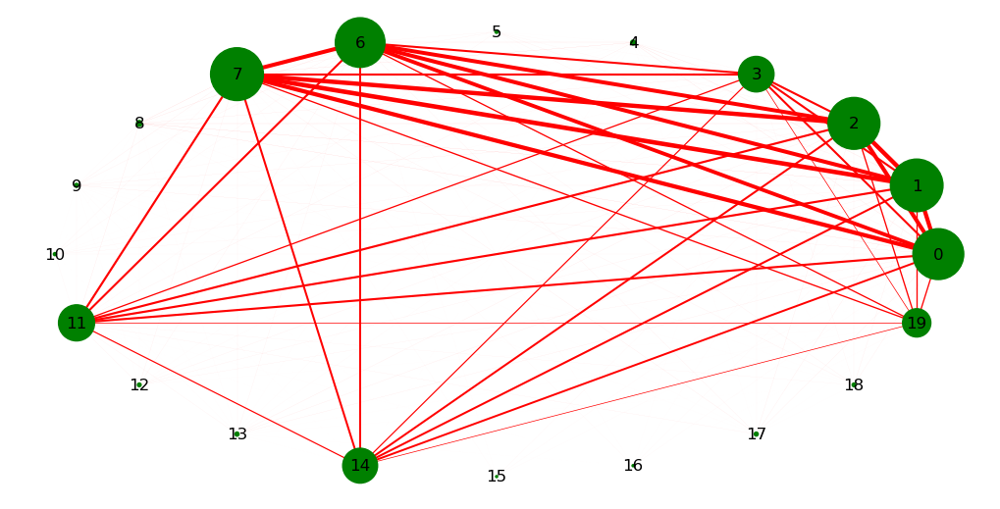

18
{0: 0.10278837301065369, 1: 0.23865579376561882, 2: 0.022293831382349073, 3: 0.26746021307378665, 4: 0.05234775746415889, 5: 0.16237011705905563, 6: 0.12343811653294752, 7: 0.09936867026173879, 8: 0.24779692226752598, 9: 0.04787583848480863, 10: 0.159344995396554, 11: 0.1144285150598448, 12: 0.07161646718400631, 13: 0.0878600552413521, 14: 0.201696698671577, 15: 0.06286991976851243, 16: 0.1626989346310667, 17: 0.29619886886755226, 18: 0.11699329212153098, 19: 0.11160068394054978}
15206


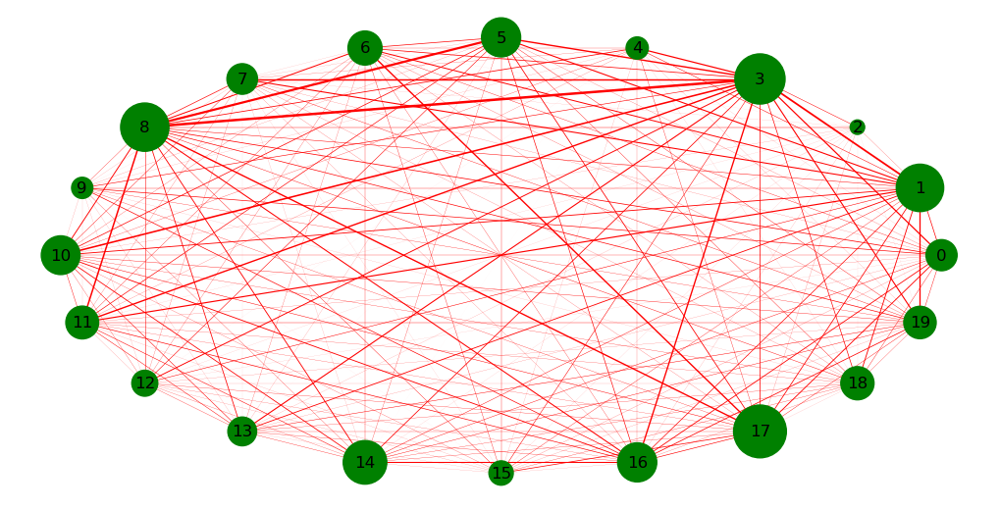

19
{0: 0.10604100117261736, 1: 0.9139339290768671, 2: 0.12648093485908374, 3: 0.5463588209130241, 4: 0.1435041041607699, 5: 0.706117827827423, 6: 0.12261938457805993, 7: 0.8201649751324249, 8: 0.15436092353726094, 9: 0.12654158748129876, 10: 0.7177631312927095, 11: 0.6634790344102544, 12: 0.06408960414055234, 13: 0.8669483644009542, 14: 0.6084064534390037, 15: 0.007055921717682261, 16: 0.8732158020298411, 17: 0.13042335530306093, 18: 0.1348509967247584, 19: 0.562714811370345}
49462


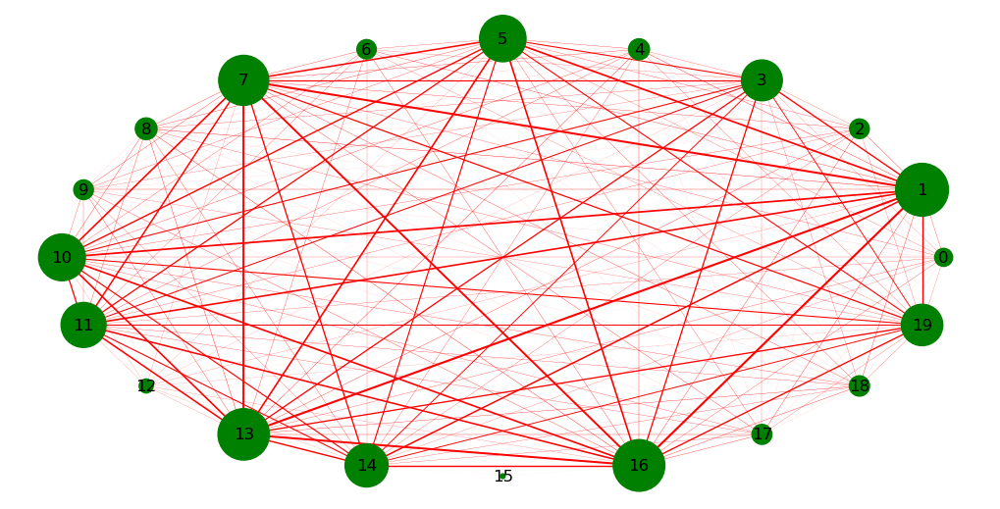

20
{0: 0.1666697048690231, 1: 0.06484131469092368, 2: 0.521082086151266, 3: 0.13970869715806553, 4: 0.9695025247461582, 5: 0.1297190878101245, 6: 0.20393021856827753, 7: 0.06894288787210383, 8: 0.052080864793918734, 9: 0.15339883697613796, 10: 0.05738556610824507, 11: 0.06938038901142972, 12: 0.06006526058661611, 13: 0.040049583462456934, 14: 0.02637767285852307, 15: 0.1504639334998268, 16: 0.017755254570975446, 17: 0.04398709371638989, 18: 0.029822994330714402, 19: 0.04019541717556556}
54857


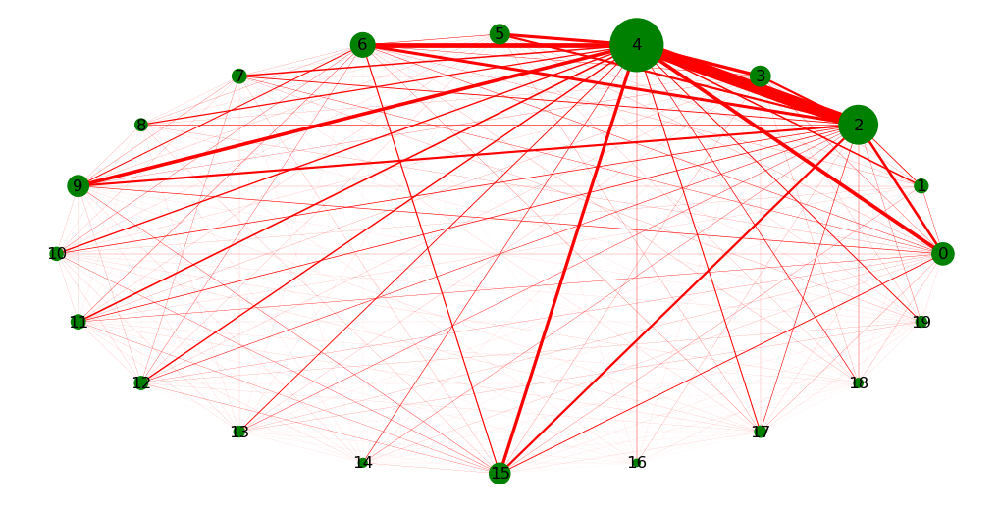

21
{0: 0.7279029462738301, 1: 0.3114632334736321, 2: 0.3253280514978955, 3: 0.19732607080960635, 4: 0.3924238672938846, 5: 0.27283981183461253, 6: 0.8138153008170339, 7: 0.2569943055211686, 8: 0.24709086407526615, 9: 0.8732359494924486, 10: 0.5387472146570933, 11: 0.29462738301559793, 12: 0.16736816043575142, 13: 0.40009903441445904, 14: 0.2904184204010894, 15: 0.12750680861599406, 16: 0.6296112899232483, 17: 0.29066600643723695, 18: 0.12106957167615746, 19: 0.35949492448625897}
4039


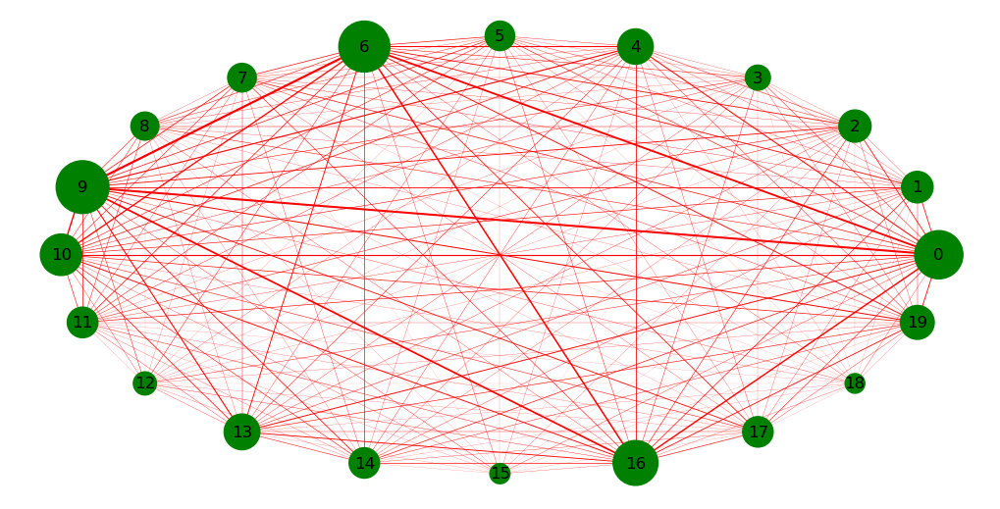

22
{0: 0.3202239456656418, 1: 0.1733284383461062, 2: 0.5918957367720619, 3: 0.22449635170483226, 4: 0.7064843283924556, 5: 0.32462943417007023, 6: 0.2117387912440916, 7: 0.21380386398054244, 8: 0.13372493231150476, 9: 0.20329493827727044, 10: 0.13693726767931716, 11: 0.2332155477031802, 12: 0.18709558992244504, 13: 0.140195493552384, 14: 0.08030838419530999, 15: 0.2652471203707953, 16: 0.053554219631958146, 17: 0.09880225781285852, 18: 0.07627001973291726, 19: 0.0933871781928319}
21791


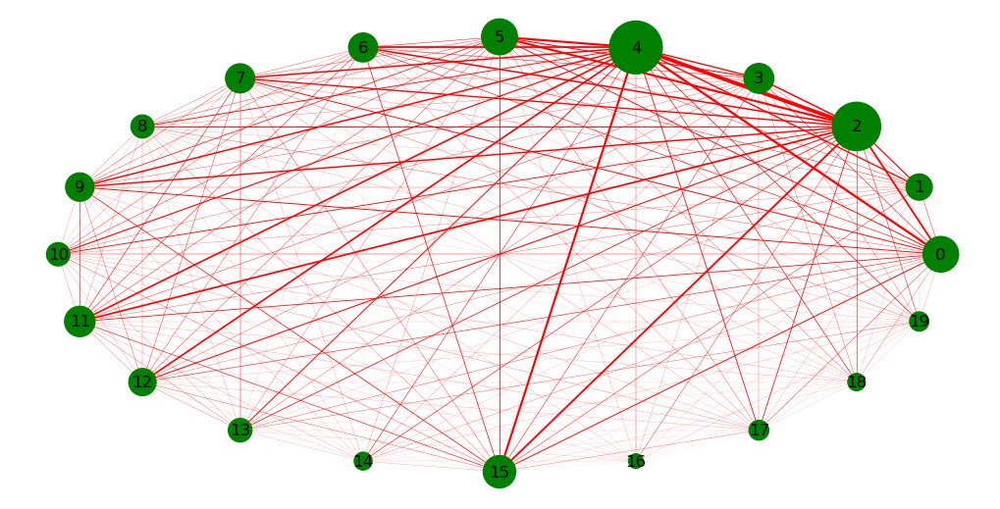

23
{0: 0.6398390342052314, 1: 0.1488933601609658, 2: 0.5560026827632462, 3: 0.10596914822266935, 4: 0.17706237424547283, 5: 0.6961770623742455, 6: 0.9014084507042254, 7: 0.12139503688799463, 8: 0.7397719651240778, 9: 0.7243460764587525, 10: 0.6130114017437961, 11: 0.749832327297116, 12: 0.07914151576123407, 13: 0.18175720992622402, 14: 0.539906103286385, 15: 0.06773977196512408, 16: 0.4024144869215292, 17: 0.1750503018108652, 18: 0.09523809523809523, 19: 0.16968477531857815}
1491


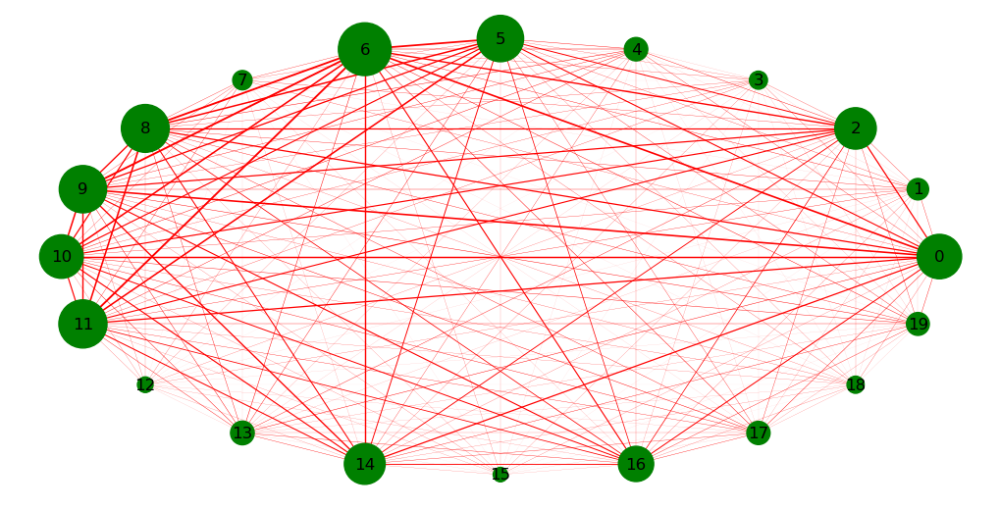

24
{0: 0.10435014678409395, 1: 0.48865759274085935, 2: 0.10088070456365092, 3: 0.008006405124099279, 4: 0.017880971443821725, 5: 0.15025353616226314, 6: 0.25647184414198027, 7: 0.0013344008540165466, 8: 0.4865225513744329, 9: 0.14571657325860687, 10: 0.012810248198558846, 11: 0.004270082732852949, 12: 0.004803843074459567, 13: 0.0024019215372297837, 14: 0.0013344008540165466, 15: 0.36802775553776357, 16: 0.0010675206832132373, 17: 0.9514278089137977, 18: 0.7526020816653323, 19: 0.004803843074459567}
3747


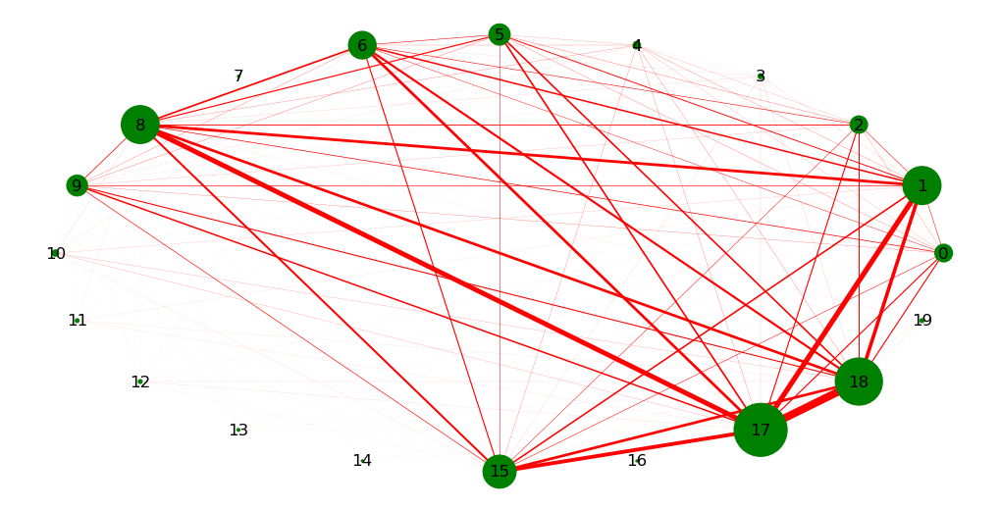

25
{0: 0.25434322033898304, 1: 0.24088983050847457, 2: 0.14480932203389832, 3: 0.41832627118644067, 4: 0.3268008474576271, 5: 0.3393008474576271, 6: 0.3375, 7: 0.15847457627118644, 8: 0.4135593220338983, 9: 0.3711864406779661, 10: 0.4551906779661017, 11: 0.21324152542372882, 12: 0.08411016949152543, 13: 0.18188559322033898, 14: 0.24343220338983051, 15: 0.11483050847457626, 16: 0.31758474576271184, 17: 0.17722457627118643, 18: 0.18177966101694915, 19: 0.2582627118644068}
9440


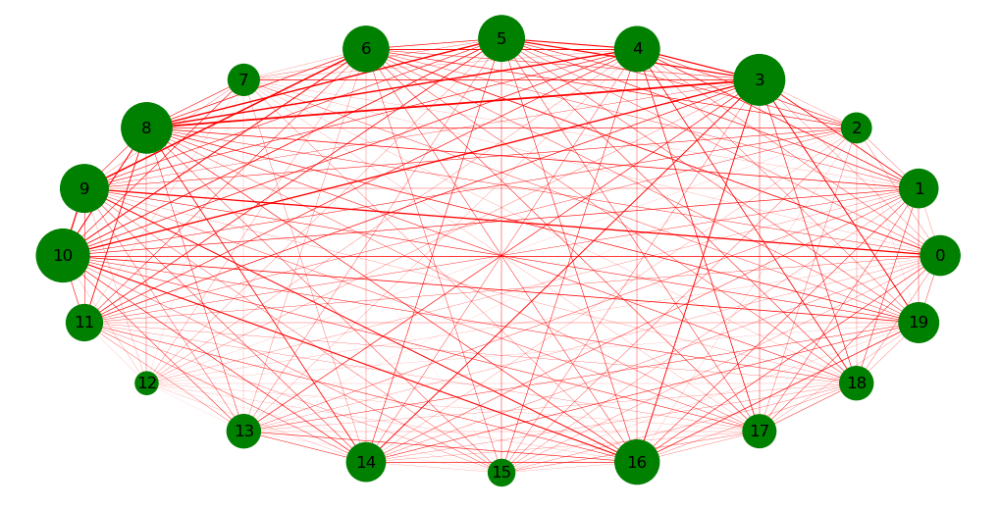

26
{0: 0.1581345483784508, 1: 0.3540605735727687, 2: 0.12999195926025195, 3: 0.14446529080675422, 4: 0.1902975073706781, 5: 0.2366657732511391, 6: 0.38354328598231036, 7: 0.02975073706781024, 8: 0.5333690699544358, 9: 0.17475207719110158, 10: 0.15491825247922808, 11: 0.1385687483248459, 12: 0.04958456177968373, 13: 0.02948271240954168, 14: 0.08067542213883677, 15: 0.18359689091396408, 16: 0.043688019297775396, 17: 0.626641651031895, 18: 0.5507906727418923, 19: 0.054945054945054944}
3731


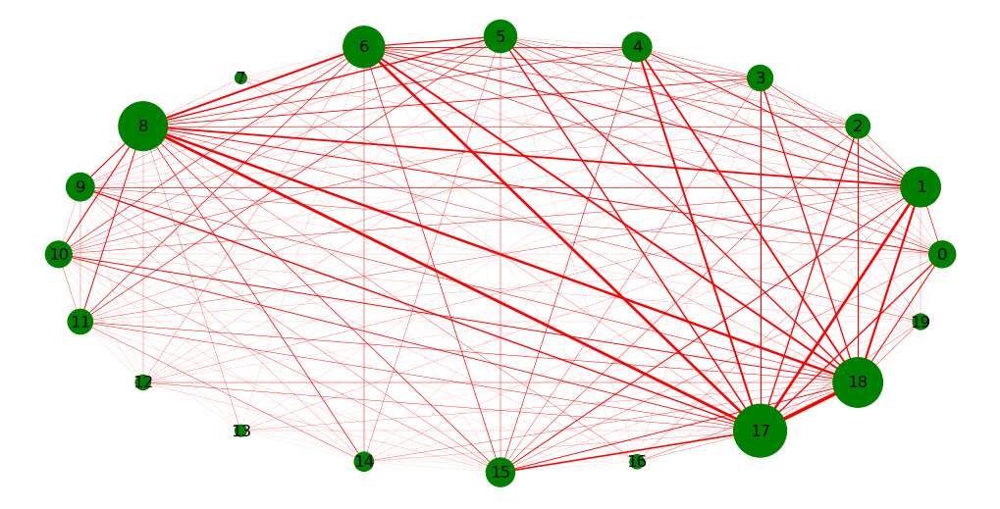

27
{0: 0.1905890395351487, 1: 0.39888344536857695, 2: 0.14838783183320042, 3: 0.9466560328130341, 4: 0.602392617067335, 5: 0.591682807337359, 6: 0.036025976985302494, 7: 0.521066423607155, 8: 0.9065512133986556, 9: 0.036960236983023816, 10: 0.7995214765865329, 11: 0.26393984277087845, 12: 0.1883331434430899, 13: 0.3532414264555087, 14: 0.8034863848695454, 15: 0.05915460863620827, 16: 0.35449470206220807, 17: 0.036344992594280506, 18: 0.2267973111541529, 19: 0.7973339409821123}
43885


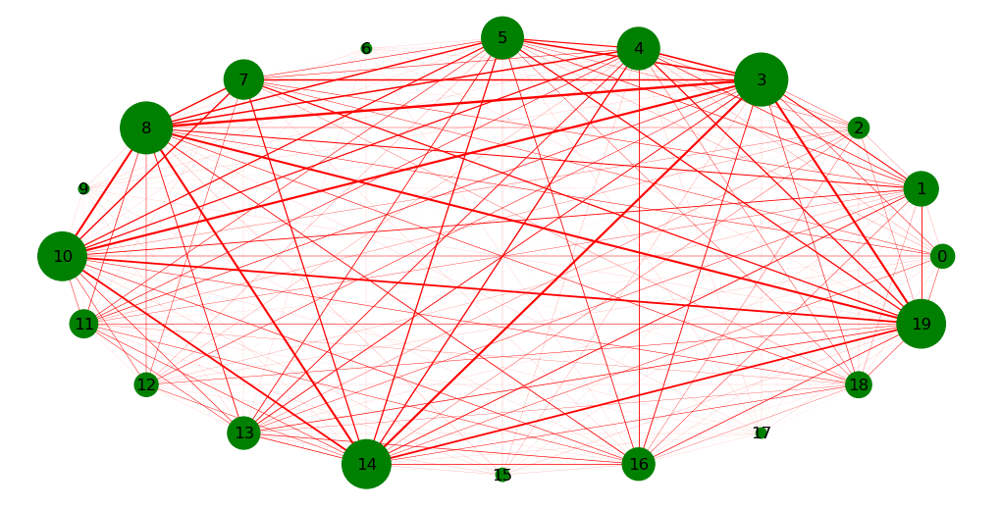

28
{0: 0.1391607390079725, 1: 0.033918938272783694, 2: 0.00384303241514298, 3: 0.04575834248341051, 4: 0.009476297321812193, 5: 0.0689358858070368, 6: 0.21790709886857307, 7: 0.2974172912588915, 8: 0.06409032319663914, 9: 0.3022151143361818, 10: 0.06158399770850241, 11: 0.3871198739676326, 12: 0.03797679858690982, 13: 0.09533584761541032, 14: 0.04781114240702726, 15: 0.0987730939991407, 16: 0.05869575595550675, 17: 0.028715329164080775, 18: 0.024227813051988352, 19: 0.09948918699575118}
41894


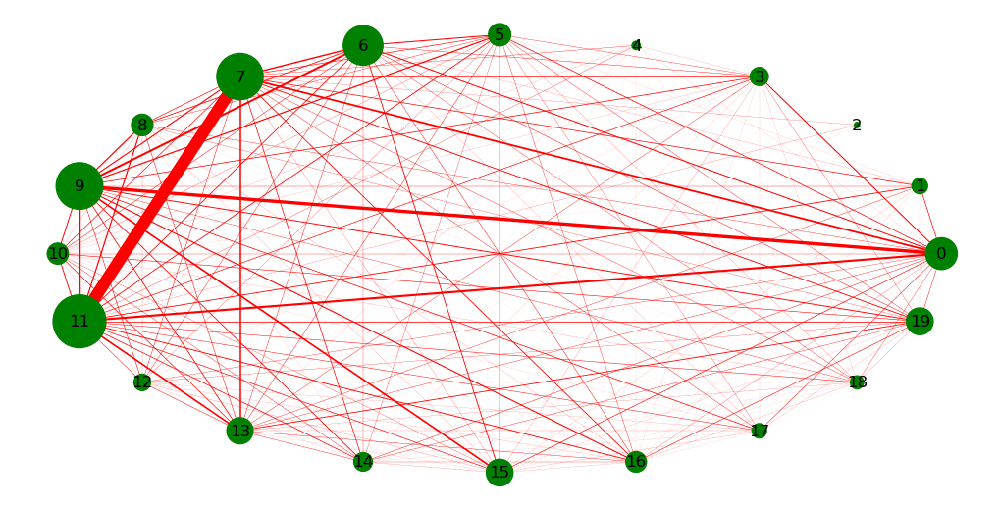

29
{0: 0.6427087153159761, 1: 0.804302652487471, 2: 0.6584769588069919, 3: 0.1090331255347757, 4: 0.1675834250091676, 5: 0.07334066740007333, 6: 0.38381615939371716, 7: 0.6533431120889867, 8: 0.15878254492115879, 9: 0.09900990099009901, 10: 0.045104510451045104, 11: 0.43417675100843417, 12: 0.08666422197775334, 13: 0.07468524630240801, 14: 0.08067473414008068, 15: 0.03129201809069796, 16: 0.0187018701870187, 17: 0.07456301185674123, 18: 0.06967363403006967, 19: 0.07028480625840362}
8181


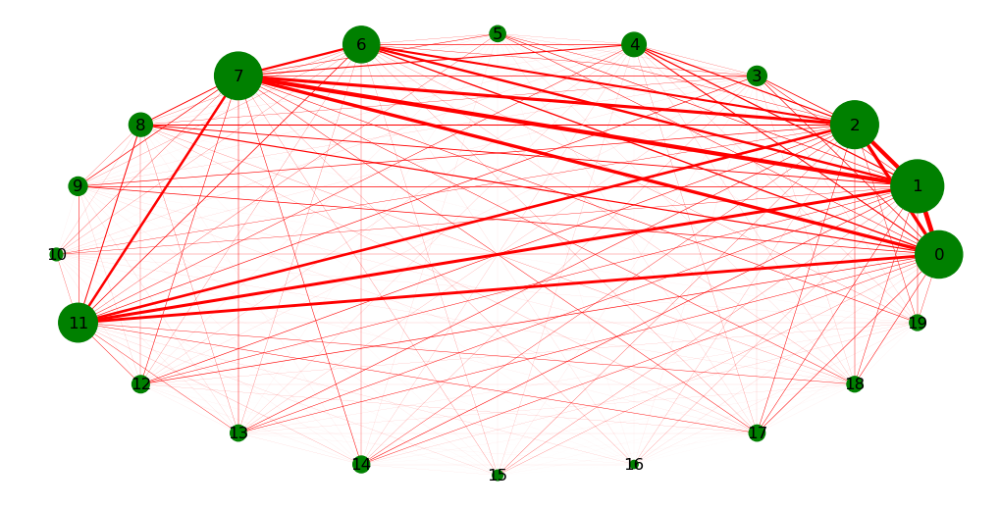

30
{0: 0.3523021849154425, 1: 0.32813850141957784, 2: 0.38134180965312925, 3: 0.263177385507962, 4: 0.591593630415998, 5: 0.3306381928157018, 6: 0.22185532650290088, 7: 0.3646154795704234, 8: 0.21151709665473398, 9: 0.1757190470312307, 10: 0.1722009628440933, 11: 0.26771386248611284, 12: 0.2277805209233428, 13: 0.2604308110109863, 14: 0.11541784964819159, 15: 0.15149364276015306, 16: 0.10140723367485496, 17: 0.11896679422293543, 18: 0.09526601654116776, 19: 0.13924206888038515}
32404


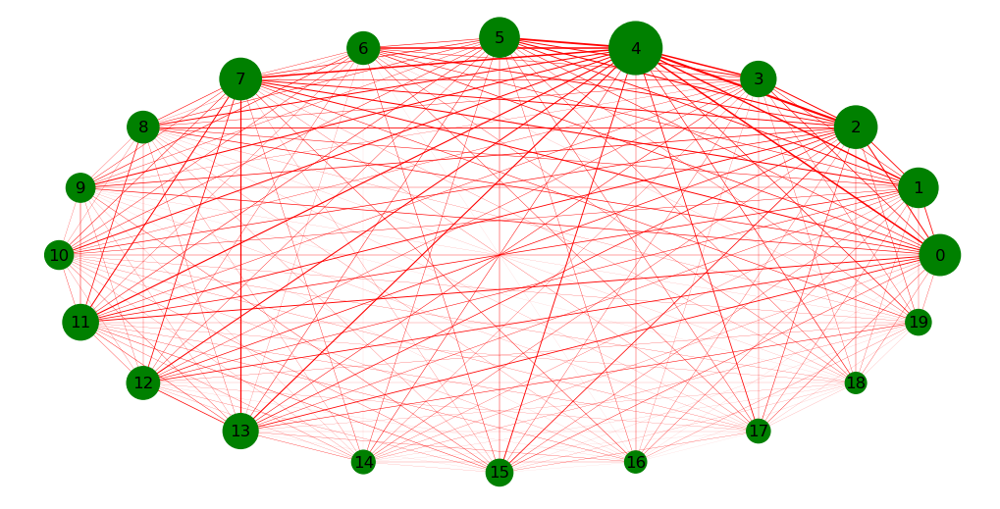

31
{0: 0.8546297438790079, 1: 0.37016798575734605, 2: 0.9623662547813365, 3: 0.2554159101725688, 4: 0.9696991063087201, 5: 0.7321570217341489, 6: 0.31693430399605155, 7: 0.37956320177680636, 8: 0.24840034549012005, 9: 0.892316370238494, 10: 0.25037457474749253, 11: 0.7659480707197124, 12: 0.2516613491741729, 13: 0.010206060178738256, 14: 0.15310852972801467, 15: 0.9599513493504434, 16: 0.0025911759003014226, 17: 0.17403183444677514, 18: 0.007614884278436833, 19: 0.006839294213040489}
56731


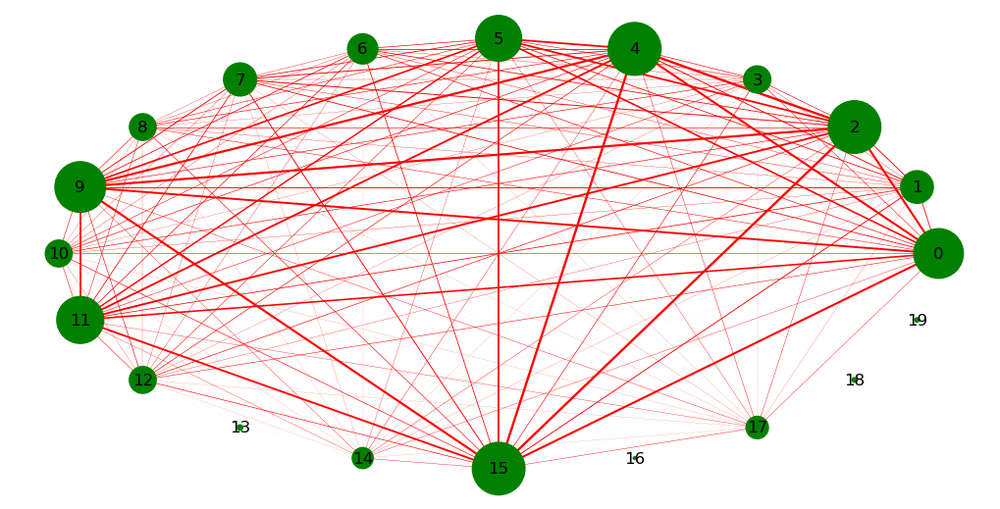

32
{0: 0.721883704735376, 1: 0.8187093779015785, 2: 0.6389275766016713, 3: 0.5732068245125348, 4: 0.9113277623026926, 5: 0.5155234447539462, 6: 0.43990831012070564, 7: 0.5753539925719592, 8: 0.5796193129062209, 9: 0.2473015320334262, 10: 0.4337569637883008, 11: 0.5916608635097493, 12: 0.22577181987000927, 13: 0.19127205199628597, 14: 0.047440807799442895, 15: 0.22342154131847725, 16: 0.04529363974001857, 17: 0.4653261374187558, 18: 0.4126624883936862, 19: 0.08086699164345404}
34464


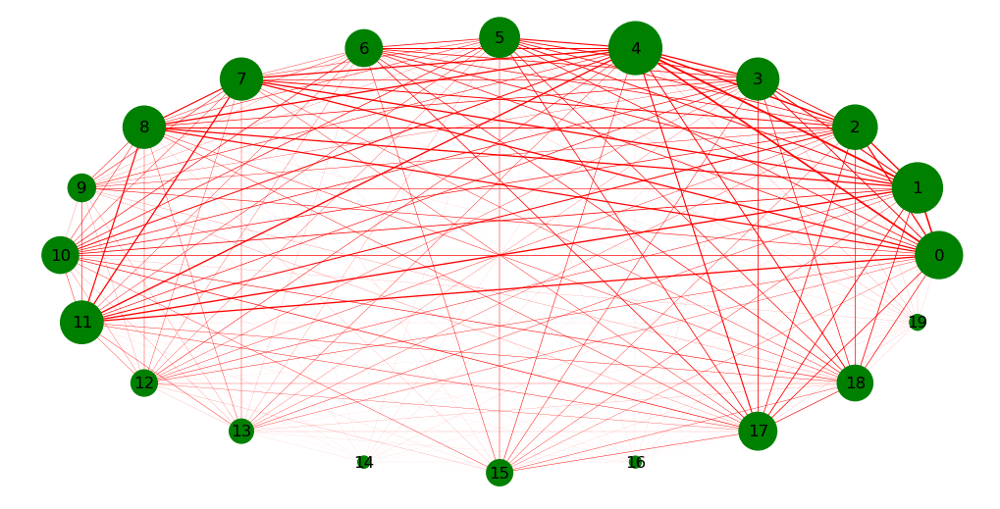

33
{0: 0.2684563758389262, 1: 0.5466748017083588, 2: 0.1635143380109823, 3: 0.004270896888346553, 4: 0.011592434411226357, 5: 0.1683953630262355, 6: 0.6400244051250763, 7: 0.0006101281269066504, 8: 0.8608907870652837, 9: 0.32031726662599147, 10: 0.004270896888346553, 11: 0.0, 12: 0.0018303843807199512, 13: 0.0006101281269066504, 14: 0.0, 15: 0.448444173276388, 16: 0.0006101281269066504, 17: 0.987797437461867, 18: 0.8584502745576571, 19: 0.0006101281269066504}
1639


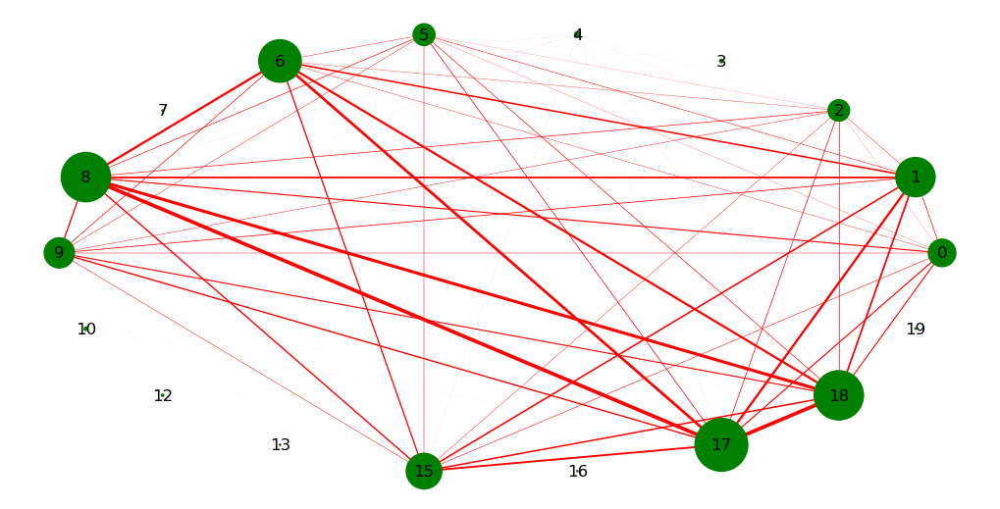

34
{0: 0.49295774647887325, 1: 0.010292524377031419, 2: 0.771397616468039, 3: 0.007583965330444204, 4: 0.014626218851570965, 5: 0.7513542795232936, 6: 0.9382448537378115, 7: 0.009750812567713976, 8: 0.9626218851570965, 9: 0.5178764897074756, 10: 0.5996749729144095, 11: 0.8114842903575298, 12: 0.0021668472372697724, 13: 0.009209100758396533, 14: 0.32990249187432286, 15: 0.004875406283856988, 16: 0.01950162513542795, 17: 0.007042253521126761, 18: 0.005417118093174431, 19: 0.009209100758396533}
1846


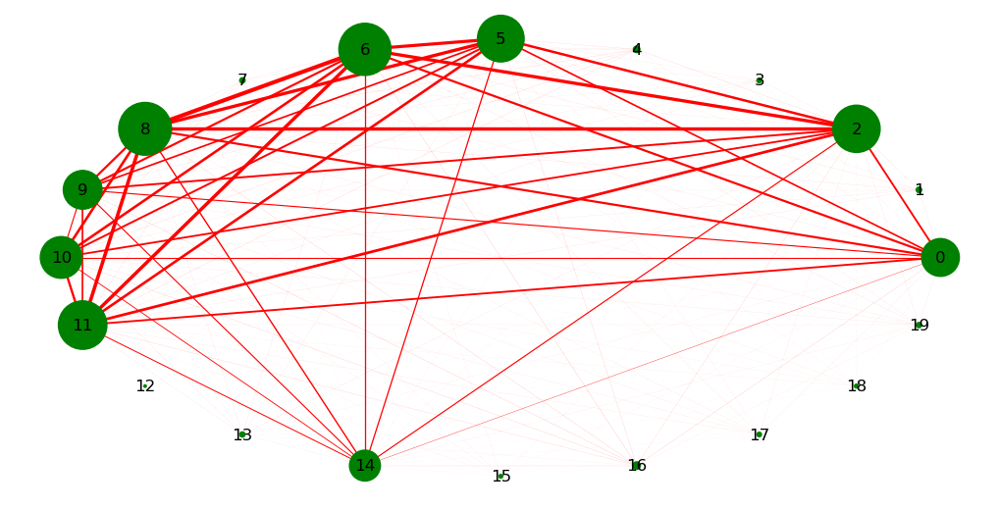

35
{0: 0.5830697567427684, 1: 0.5486802001265167, 2: 0.5600667088389212, 3: 0.3487262062223245, 4: 0.6033699465179136, 5: 0.31174880671689, 6: 0.18908505376962448, 7: 0.5740985680602679, 8: 0.3333141641267468, 9: 0.16061878198861348, 10: 0.15015239519236298, 11: 0.38173557996434526, 12: 0.35654724250963254, 13: 0.33664960607280464, 14: 0.107079187992409, 15: 0.050721720627983205, 16: 0.07441485996894588, 17: 0.1197883719592846, 18: 0.09810799930990856, 19: 0.17246535165909482}
17389


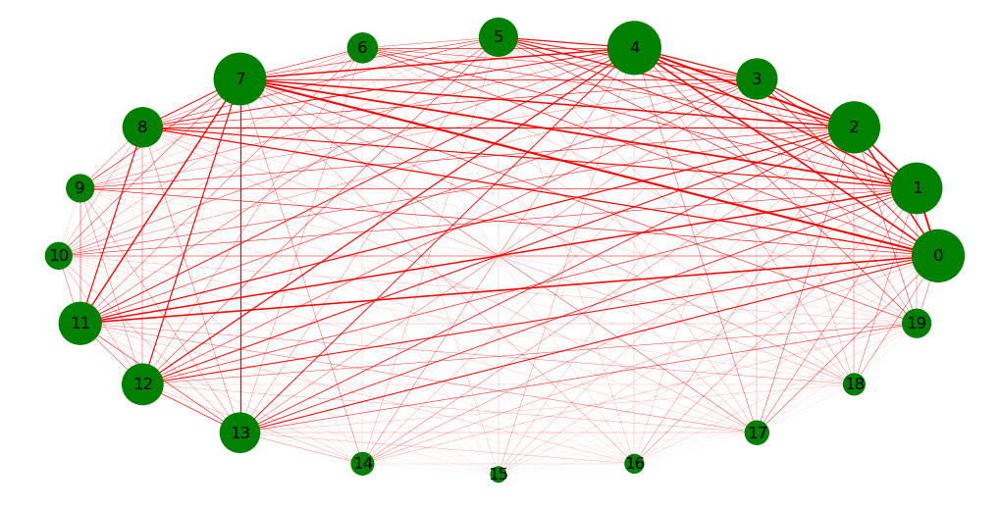

36
{0: 0.8141732283464567, 1: 0.06299212598425197, 2: 0.07673586256263422, 3: 0.09277022190408017, 4: 0.1357193987115247, 5: 0.10837508947745168, 6: 0.8044380816034359, 7: 0.09778095919828203, 8: 0.08260558339298497, 9: 0.9503221188260559, 10: 0.3593414459556192, 11: 0.09749463135289907, 12: 0.08589835361488905, 13: 0.21603435934144596, 14: 0.2509663564781675, 15: 0.0933428775948461, 16: 0.7551896921975663, 17: 0.22290622763063708, 18: 0.0737294201861131, 19: 0.2304939155332856}
6985


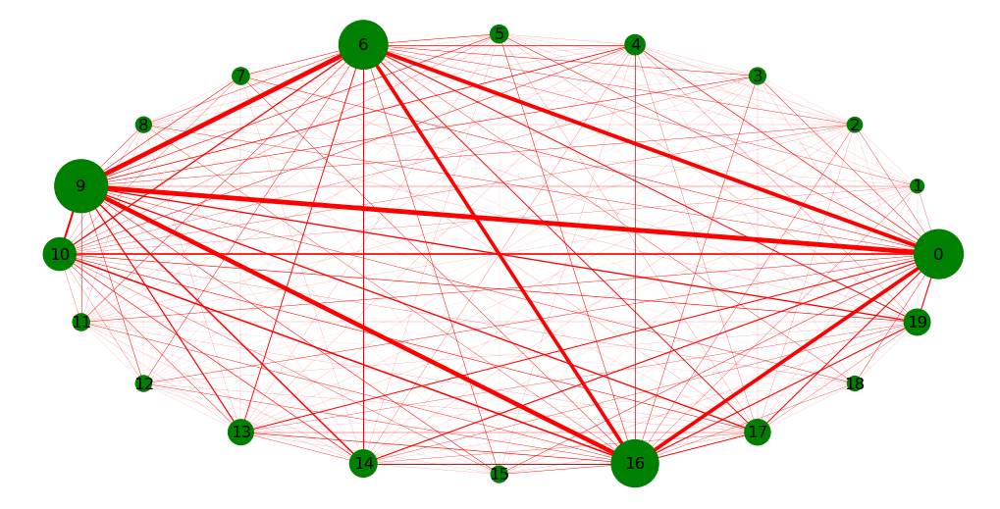

37
{0: 0.2292809702570026, 1: 0.06064106266243142, 2: 0.6170950043315044, 3: 0.0412936760034652, 4: 0.18798729425353738, 5: 0.6254692463182212, 6: 0.7860236788911349, 7: 0.033208200981807684, 8: 0.8625469246318221, 9: 0.603234190008663, 10: 0.3003176436615651, 11: 0.600346520358071, 12: 0.036673404562518046, 13: 0.033785734911926074, 14: 0.14091827894888825, 15: 0.12792376552122436, 16: 0.06410626624314178, 17: 0.09009529309846953, 18: 0.05717585908172105, 19: 0.03725093849263644}
3463


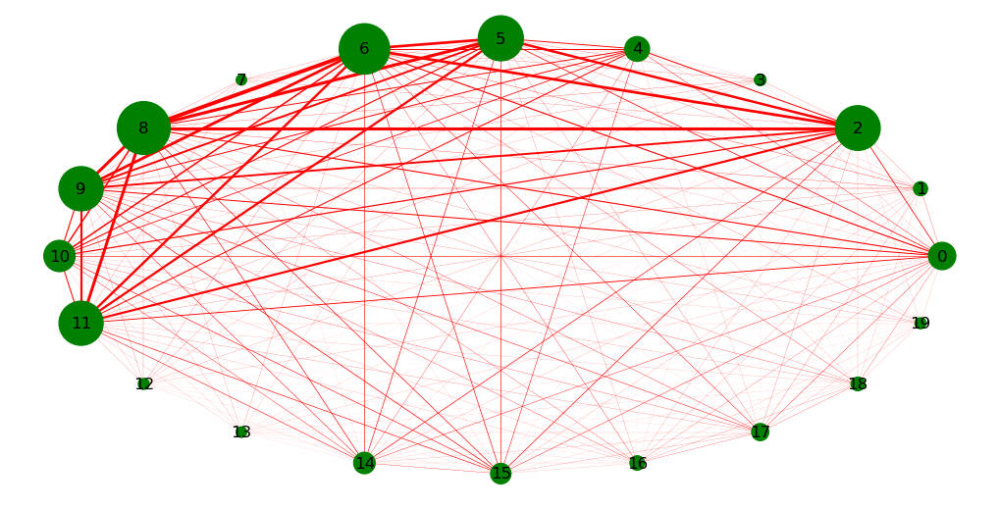

38
{0: 0.38382308391396547, 1: 0.5301423810966374, 2: 0.4422902150863375, 3: 0.21054225992123599, 4: 0.539533474704635, 5: 0.5898212662829445, 6: 0.7176613147531051, 7: 0.07512874886398062, 8: 0.6307179642532565, 9: 0.35958800363526205, 10: 0.4177521963041503, 11: 0.23810966373826115, 12: 0.10421084519842472, 13: 0.034534989397152376, 14: 0.054831869130566493, 15: 0.46440472584065434, 16: 0.041805513480763404, 17: 0.6728264162375038, 18: 0.5989094213874584, 19: 0.09300212056952438}
3301


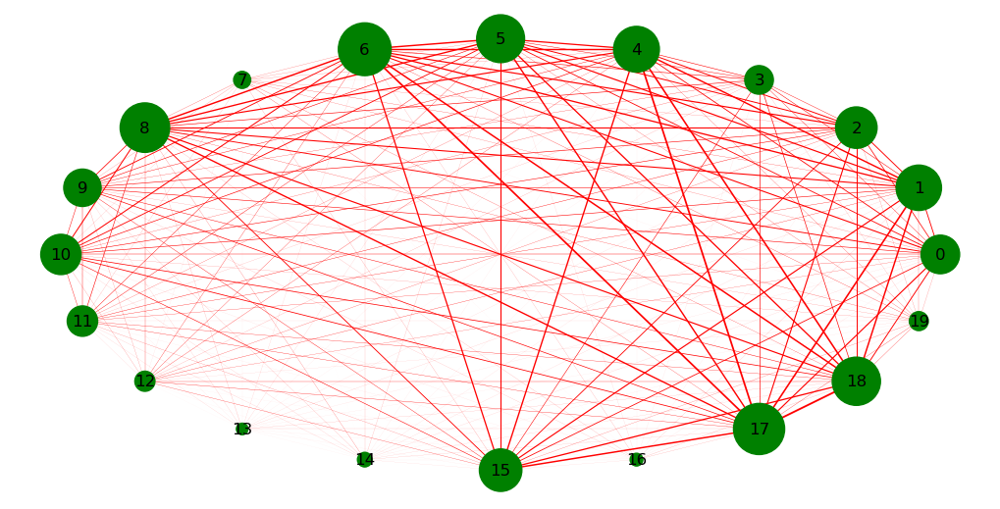

39
{0: 0.4853683148335015, 1: 0.20873576473980107, 2: 0.2704339051463169, 3: 0.18451780308490703, 4: 0.3358800634279948, 5: 0.31267118350872136, 6: 0.6781029263370333, 7: 0.07712267550814474, 8: 0.3009946662822546, 9: 0.6678679544471674, 10: 0.4898371053769641, 11: 0.20441112872999856, 12: 0.0915381288741531, 13: 0.18048147614242468, 14: 0.1326221709672769, 15: 0.2198356638316275, 16: 0.4442842727403777, 17: 0.308634856566239, 18: 0.21608764595646532, 19: 0.14574023353034454}
6937


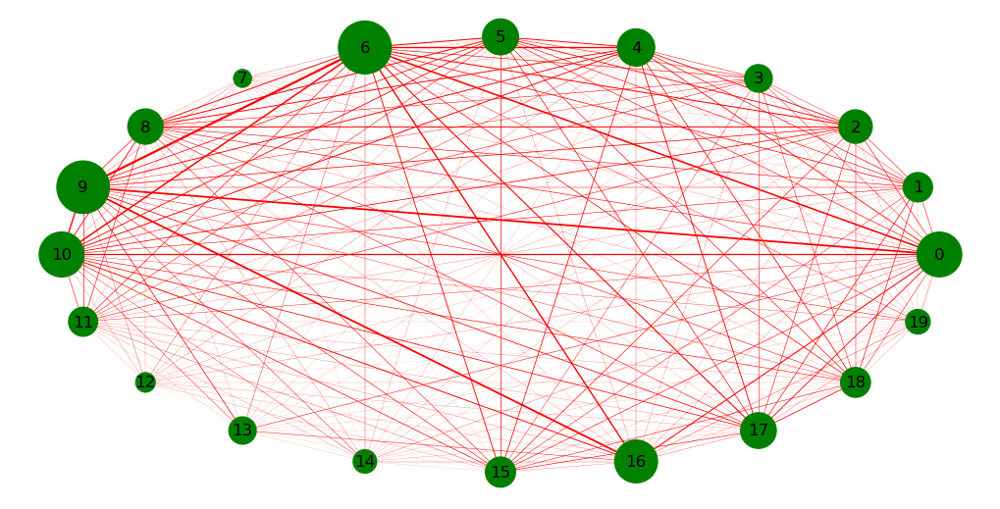

In [621]:
clusters = [data[k.labels_ == i] for i in range(n_clusters)]
# clusters = [c.ballots for c in old_clusters]
for see_cluster in range(n_clusters):
    print(see_cluster)
    print({i:x for i,x in enumerate(np.mean(clusters[see_cluster],0))})
    print(len(clusters[see_cluster]))
    cluster_0 = Counter([tuple(np.where(x == 1)[0]) for x in clusters[see_cluster]])

    edge_dict = {}
    for key,value in cluster_0.items():
        for perm in permutations(key, 2):
            try:
                edge_dict[(perm[0], perm[1])] += value
            except KeyError:
                try: 
                    edge_dict[(perm[1], perm[0])] += value
                except KeyError:
                    edge_dict[(perm[0], perm[1])] = value

    edge_list = [(*key, {'weight':value}) for key,value in edge_dict.items()]
    
    G = nx.Graph()
    G.add_nodes_from(sorted(set([y for x in cluster_0.keys() for y in x])))
    G.add_edges_from(edge_list)
    rcParams['figure.figsize'] = 10, 5
    rcParams['figure.dpi'] = 100
    options = {
        'node_color': 'g',
        'edge_color':'r'
    }
    edges = G.edges()
    weights = [G[u][v]['weight'] for u,v in edges]
    weights /= np.mean(weights)*3
    
    nodes = G.nodes()
    s = np.sum(clusters[see_cluster],0)
    s /= max(s)
    s *= 1500
    node_size = [s[n] for n in nodes]

    nx.draw_circular(G, node_size=node_size, with_labels=True, edgelist=edges, width=weights, **options)
    plt.show()
